# Project task - Solar Energy Production
This notebook will contain the exploratory data analysis, all manipulation and cleaning of the given datasets and finally the creation of predictions using the different ML models

In [41]:
#importing necessary datasets
import os
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns


#Setting max display options to avoid local crashes
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 200)

## Reading in the datasets

In [42]:
Y_train_a = pd.read_parquet('data/A/train_targets.parquet')
Y_train_b = pd.read_parquet('data/B/train_targets.parquet')
Y_train_c = pd.read_parquet('data/C/train_targets.parquet')

In [43]:
X_train_estimated_a = pd.read_parquet('data/A/X_train_estimated.parquet')
X_train_estimated_b = pd.read_parquet('data/B/X_train_estimated.parquet')
X_train_estimated_c = pd.read_parquet('data/C/X_train_estimated.parquet')

In [44]:
X_train_observed_a = pd.read_parquet('data/A/X_train_observed.parquet')
X_train_observed_b = pd.read_parquet('data/B/X_train_observed.parquet')
X_train_observed_c = pd.read_parquet('data/C/X_train_observed.parquet')

In [45]:
X_test_estimated_a = pd.read_parquet('data/A/X_test_estimated.parquet')
X_test_estimated_b = pd.read_parquet('data/B/X_test_estimated.parquet')
X_test_estimated_c = pd.read_parquet('data/C/X_test_estimated.parquet')

### Combining the datasets
A seperate combined dataset will be made for the A, B and C location.\
Each location will have a X dataset (containing only feature values) and a complete training dataset (X_train combined with the Y_train values) which can be used to check for feature correlation. 


*Note: The resolution is different between the X and Y datasets, as Y each row in Y contains an hour and each row in X is per 15 minutes. To begin with the X datset will be naivly changed to have a resolution of every hour aswell. However we will later explore feature exploration techniques to retain more data from X by artifically increasing the resolution of the Y data*

#### Location A

In [46]:
#Create the X dataset for location A
X_train_estimated_a["estimated"] = 1.0
X_test_estimated_a["estimated"] = 1.0
X_train_observed_a["estimated"] = 0.0
X_train_observed_a["date_calc"] = X_train_observed_a["date_forecast"].copy() #date calc column added to observed data so that observed and estimated has equal nr cols

X_train_estimated_a["train/test"] = "train"
X_train_observed_a["train/test"] = "train"
X_test_estimated_a["train/test"] = "test"

X_all_a= pd.concat([X_train_observed_a, X_train_estimated_a, X_test_estimated_a], ignore_index=True)
X_all_a.set_index('date_forecast', inplace=True)

*Create the complete training set for A*

In [47]:
#Create the complete train dataset for location A
train_all_a = pd.concat([X_train_observed_a.drop("train/test", axis=1), X_train_estimated_a.drop("train/test", axis=1)], ignore_index=True)
train_all_a.set_index('date_forecast', inplace=True)

#remove all non hourly values
train_all_a = train_all_a[train_all_a.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_a.set_index('time', inplace=True)

#Concatenate with y data
train_all_a = pd.concat([train_all_a, Y_train_a], axis=1)

In [48]:
train_all_a.head()


,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,date_calc,pv_measurement
2019-06-02 22:00:00,7.7,1.230,1744.900024,0.000000,0.0,1744.900024,0.0,280.299988,0.0,0.000000,0.0,0.0,98.699997,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1006.799988,0.0,0.0,994.200012,1000.299988,0.0,0.0,73.099998,1006.299988,NaN,0.0,0.0,-0.0,0.1,342.834015,-3.202,0.0,285.899994,100.0,39640.101562,3.7,-3.6,-0.8,-0.0,0.0,2019-06-02 22:00:00,0.00
2019-06-02 23:00:00,7.7,1.225,1703.599976,0.000000,0.0,1703.599976,0.0,280.299988,0.0,0.000000,0.0,0.0,99.599998,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1005.500000,0.0,0.0,993.000000,999.000000,0.0,0.0,69.199997,1005.000000,NaN,0.0,0.0,-0.0,0.2,356.742004,-4.393,0.0,286.799988,100.0,41699.898438,3.5,-3.5,0.0,-0.0,0.0,2019-06-02 23:00:00,0.00
2019-06-03 00:00:00,7.7,1.221,1668.099976,0.000000,0.0,1668.099976,0.0,280.200012,0.0,0.000000,0.0,0.0,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1004.599976,0.0,0.0,992.099976,998.099976,0.0,0.1,66.000000,1004.099976,NaN,0.0,0.0,-0.0,0.2,9.741000,-3.910,0.0,287.000000,100.0,20473.000000,3.2,-3.1,0.7,-0.0,0.0,2019-06-03 00:00:00,0.00
2019-06-03 01:00:00,8.2,1.218,1388.400024,0.000000,0.0,1388.400024,0.0,281.299988,0.0,0.000000,0.0,0.0,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1004.400024,0.0,0.0,991.799988,997.799988,0.0,0.2,71.099998,1003.799988,NaN,0.0,0.0,-0.0,0.7,23.541000,-1.986,0.0,286.899994,100.0,2104.600098,2.8,-2.7,0.8,-0.0,0.0,2019-06-03 01:00:00,0.00
2019-06-03 02:00:00,8.8,1.219,1108.500000,6546.899902,9.8,1108.500000,0.0,282.299988,4.3,7743.299805,0.0,0.0,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1003.400024,0.0,0.0,990.900024,996.900024,0.0,0.1,78.500000,1002.900024,NaN,0.0,0.0,-0.0,0.3,37.040001,1.401,0.0,286.500000,100.0,2681.600098,2.7,-2.5,1.0,-0.0,0.0,2019-06-03 02:00:00,19.36


#### Location B

In [49]:
#Combine all data from B
X_train_estimated_b["estimated"] = 1.0
X_test_estimated_b["estimated"] = 1.0
X_train_observed_b["estimated"] = 0.0
X_train_observed_b["date_calc"] = X_train_observed_b["date_forecast"].copy()

X_train_estimated_b["train/test"] = "train"
X_train_observed_b["train/test"] = "train"
X_test_estimated_b["train/test"] = "test"

X_all_b= pd.concat([X_train_observed_b, X_train_estimated_b, X_test_estimated_b], ignore_index=True)
X_all_b.set_index('date_forecast', inplace=True)

*Create the complete training set*

In [50]:
#Create the complete train dataset for location A
train_all_b = pd.concat([X_train_observed_b.drop("train/test", axis=1), X_train_estimated_b.drop("train/test", axis=1)], ignore_index=True)
train_all_b.set_index('date_forecast', inplace=True)
#remove all non hourly values
train_all_b = train_all_b[train_all_b.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_b.set_index('time', inplace=True)

#Concatenate with y data
train_all_b = pd.concat([train_all_b, Y_train_b], axis=1)

In [51]:
#Drop the first row, as it is not in the X data
train_all_b.drop("2018-12-31 23:00:00", inplace=True)

#### Location C

In [52]:
#Combine all data from C
X_train_estimated_c["estimated"] = 1.0
X_test_estimated_c["estimated"] = 1.0
X_train_observed_c["estimated"] = 0.0
X_train_observed_c["date_calc"] = X_train_observed_c["date_forecast"].copy()
X_train_estimated_c["train/test"] = "train"
X_train_observed_c["train/test"] = "train"
X_test_estimated_c["train/test"] = "test"

X_all_c= pd.concat([X_train_observed_c, X_train_estimated_c, X_test_estimated_c], ignore_index=True)
X_all_c.set_index('date_forecast', inplace=True)

*Create Complete training data for location C*

In [53]:
#Create the complete train dataset for location A
train_all_c = pd.concat([X_train_observed_c.drop("train/test", axis=1), X_train_estimated_c.drop("train/test", axis=1)], ignore_index=True)
train_all_c.set_index('date_forecast', inplace=True)
#remove all non hourly values
train_all_c = train_all_c[train_all_c.index.minute == 0]

#Set the index as the date forecast for y aswell
Y_train_c.set_index('time', inplace=True)

#Concatenate with y data
train_all_c = pd.concat([train_all_c, Y_train_c], axis=1)

In [54]:
train_all_c.drop("2018-12-31 23:00:00", inplace=True)

#### Lets make a combined dataset for all locations
This is in order to quickly check correlations and get a brief overview about all locations

In [55]:
copy_a = X_all_a.copy()
copy_b = X_all_b.copy()
copy_c = X_all_c.copy()

copy_a["location"] = "A"
copy_b["location"] = "B"
copy_c["location"] = "C"
X_all = pd.concat([copy_a, copy_b, copy_c])

In [56]:
copy_a_train = train_all_a.copy()
copy_b_train = train_all_b.copy()
copy_c_train = train_all_c.copy()

copy_a_train["location"] = "A"
copy_b_train["location"] = "B"
copy_c_train["location"] = "C"

train_all = pd.concat([copy_a_train, copy_b_train, copy_c_train])

#### Lets finally create a test dataset for all the X samples

In [57]:
X_test = X_all[X_all["train/test"] == "test"]
X_test = X_test.drop("train/test", axis=1)

## Creating a feature dataset with averrage of the hourly values - only run to compute rest of notebook on avg values
Creating an average of all the feature values for an hour.
If a Nan is encountered it will just add this as a zero to the feature value - if all Nan it will turn this into Nan, if 1 value not Nan it will use this value.
Also needs to take the categorical features into account.

In [58]:
def resample_df_hourly_keep_categorical(df, hourly_df, categorical_col_list):
    """ 
    Hourly df must just be hourly index in the dataframe
    """
    indices_to_keep = hourly_df.index
    resampled_df = df.resample('1H').mean()
    
    for col in categorical_col_list:
        resampled_df[col] = df.resample('1H')[col].agg(lambda x: x.mode()[0] if not x.isna().all() else np.nan)

    resampled_df = resampled_df[resampled_df.index.isin(indices_to_keep)]
    return resampled_df

def resample_df_no_categorical(df, hourly_df):
    indices_to_keep = hourly_df.index
    resampled_df = df.resample('1H').mean()
    resampled_df = resampled_df[resampled_df.index.isin(indices_to_keep)]
    return resampled_df

In [20]:
#use to create average with categorical values
cat_cols = ['dew_or_rime:idx', 'is_day:idx','is_in_shadow:idx','precip_type_5min:idx', "estimated"]
train_all_avg_a = resample_df_hourly_keep_categorical(X_all_a.drop(["train/test"], axis=1), train_all_a, cat_cols)
train_all_avg_b = resample_df_hourly_keep_categorical(X_all_b.drop(["train/test"], axis=1), train_all_b, cat_cols)
train_all_avg_c = resample_df_hourly_keep_categorical(X_all_c.drop(["train/test"], axis=1), train_all_c, cat_cols)

In [18]:
#use to create averages without keeping things categorical
train_all_avg_a = resample_df_no_categorical(X_all_a.drop(["train/test"], axis = 1), train_all_a)
train_all_avg_b = resample_df_no_categorical(X_all_b.drop(["train/test"], axis = 1), train_all_b)
train_all_avg_c = resample_df_no_categorical(X_all_c.drop(["train/test"], axis = 1), train_all_c)

In [19]:
print(f"train: {len(train_all_c)} avg: {len(train_all_avg_c)}") 

train: 33625 avg: 33625


In [20]:
#Add back locations
train_all_avg_a["location"] = "A"
train_all_avg_b["location"] = "B"
train_all_avg_c["location"] = "C"

#add in pv measurements
train_all_avg_c = pd.concat([train_all_avg_c, Y_train_c], axis=1)
train_all_avg_b = pd.concat([train_all_avg_b, Y_train_b], axis=1)
train_all_avg_a = pd.concat([train_all_avg_a, Y_train_a], axis=1)


In [21]:
train_all_avg = pd.concat([train_all_avg_a, train_all_avg_b,train_all_avg_c])

In [22]:
train_all = train_all_avg.copy()
train_all.head()

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,date_calc,location,pv_measurement
2019-06-02 22:00:00,7.700,1.22825,1728.949951,0.000000,0.00,1728.949951,0.0,280.299988,0.000,0.000000,0.00,0.000000,99.074997,6.0,0.0,0.0,0.0,0.0,0.0,0.00,1.0,1006.299988,0.0,0.0,993.750000,999.775024,0.0,0.000,71.674995,1005.799988,NaN,0.0,0.0,0.0,0.175,348.036743,-3.77425,0.0,286.225006,100.000000,40386.476562,3.600,-3.575,-0.500,0.0,0.0,2019-06-02 22:22:30,A,0.00
2019-06-02 23:00:00,7.700,1.22350,1689.824951,0.000000,0.00,1689.824951,0.0,280.299988,0.000,0.000000,0.00,0.000000,99.750000,6.0,0.0,0.0,0.0,0.0,0.0,0.00,1.0,1005.200012,0.0,0.0,992.674988,998.650024,0.0,0.025,68.000000,1004.650024,NaN,0.0,0.0,0.0,0.200,91.980751,-4.35725,0.0,286.899994,100.000000,33770.648438,3.350,-3.350,0.275,0.0,0.0,2019-06-02 23:22:30,A,0.00
2019-06-03 00:00:00,7.875,1.21975,1563.224976,0.000000,0.00,1563.224976,0.0,280.649994,0.000,0.000000,0.00,0.000000,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.00,1.0,1004.525024,0.0,0.0,992.000000,997.974976,0.0,0.100,67.949997,1003.950012,NaN,0.0,0.0,0.0,0.400,14.934750,-3.30950,0.0,286.950012,100.000000,13595.500000,3.050,-2.950,0.750,0.0,0.0,2019-06-03 00:22:30,A,0.00
2019-06-03 01:00:00,8.425,1.21800,1283.425049,208.649994,0.75,1283.425049,0.0,281.674988,0.300,526.775024,0.00,0.000000,100.000000,6.0,0.0,0.0,0.0,0.0,0.0,0.25,1.0,1004.025024,0.0,0.0,991.500000,997.449951,0.0,0.125,73.875000,1003.449951,NaN,0.0,0.0,0.0,0.550,28.630251,-0.82250,0.0,286.750000,100.000000,2321.850098,2.725,-2.600,0.875,0.0,0.0,2019-06-03 01:22:30,A,0.00
2019-06-03 02:00:00,8.950,1.21800,1003.500000,32468.150391,23.10,1003.500000,0.0,282.500000,11.975,22068.949219,0.15,282.975006,84.875000,6.0,0.0,0.0,0.0,0.0,0.0,1.00,0.0,1003.099976,0.0,0.0,990.550049,996.500000,0.0,0.100,79.925003,1002.500000,NaN,0.0,0.0,0.0,0.250,41.997501,3.05125,0.0,286.450012,99.224998,11634.799805,2.550,-2.350,0.925,0.0,0.0,2019-06-03 02:22:30,A,19.36


In [145]:
date_rng = pd.date_range(start='2023-01-01', periods=8, freq='15T')

# Create a DataFrame with a datetime index
df = pd.DataFrame(index=date_rng)

# Add some sample data with NaN values
df['value'] = [10, np.nan, np.nan,4.0, 5.0, 6.0, np.nan, 8.0]
df["cat"] = [np.nan, np.nan, np.nan , np.nan, 0, 0, 0, 1]

def custom_mode(x):
    return x.mode().iloc[0] if not x.mode().empty else np.nan


In [148]:
def resample_df_hourly_keep_categorical(df, hourly_df, categorical_col_list):
    """ 
    Hourly df must just be hourly index in the dataframe
    """
    indices_to_keep = hourly_df.index
    resampled_df = df.resample('1H').mean()
    
    for col in categorical_col_list:
        resampled_df[col] = df.resample('1H')[col].agg(lambda x: x.mode()[0] if not x.isna().all() else np.nan)

    resampled_df = resampled_df[resampled_df.index.isin(indices_to_keep)]
    return resampled_df

def resample_hourly(df, hourly_df):

                        value  cat
2023-01-01 00:00:00  7.000000  NaN
2023-01-01 01:00:00  6.333333  0.0


## Exploratory Data Analysis

Lets start by making some quick graphs of the all the data combined

In [20]:
fig, axes = plt.subplots(nrows=17, ncols=3, figsize=(15, 20))
axes = axes.flatten()

for i, column in enumerate(X_all.drop("date_calc", axis=1).columns):
    sns.histplot(data=X_all[column], kde=False, ax=axes[i])
    axes[i].set_xlabel(column, fontsize = 20)


*Observations*
- Based on this is seems like snow density is completely filled with Nan values
- We have a random dip in the date forecast at the end of 2022
- Snow Density has VERY low count compared to the other features
- All the radian features have a strange distribution

#### Lets check the train data

In [46]:
fig, axes = plt.subplots(nrows=16, ncols=3, figsize=(40, 140), dpi=200)
axes = axes.flatten()

for i, column in enumerate(train_all.drop("date_calc", axis=1).columns):
    sns.histplot(data=train_all[column], kde=False, ax=axes[i])
    axes[i].set_xlabel(column, fontsize = 20)


Plotting the PV-measurements for the different datasets

In [99]:
train_all["pv_measurement"].describe()

count    93023.000000
mean       287.022737
std        766.411327
min         -0.000000
25%          0.000000
50%          0.000000
75%        172.920000
max       5733.420000
Name: pv_measurement, dtype: float64

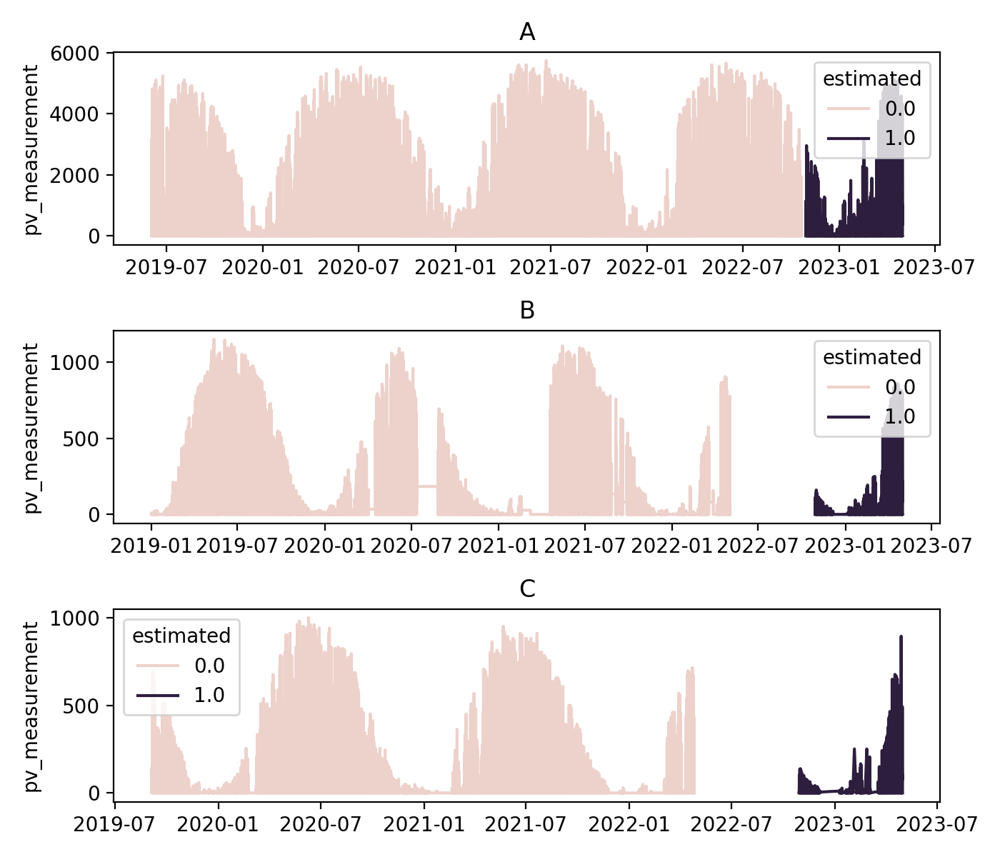

In [40]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(7, 6), dpi=200)
feature = "pv_measurement"
sns.lineplot(data = train_all_a, y=feature, x = train_all_a.index, ax=axs[0], hue="estimated")
sns.lineplot(data = train_all_b, y=feature, x = train_all_b.index, ax=axs[1], hue="estimated")
sns.lineplot(data = train_all_c, y=feature, x = train_all_c.index, ax=axs[2], hue="estimated")
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()
plt.show()


Already we see that season plays a large role in the PV measurement!
This should be added as a feature (maybe month?)
Maybe the date forecast could be used as a feature to somehowe encode this info, or make a month feature from it!

Clear sky looks a little to perfect

## Lets check areas with constant PV_measurement

In [48]:
train_all_b["pv_measurement"].dropna().to_csv("train_b_dropped_nani.csv")

In [12]:
###OBS, burde beholde rows annen en kun første. Kanskje beholde threshold -1 rader

data = {'Value': [1, 1, 1, 2, 3, 3, 3, 3, 3, 0, 0, 0, 0, 0, 1, 1, 1, 2, 2]}
df = pd.DataFrame(data)

threshold = 3  # Set your threshold here

# Create a boolean mask to identify consecutive duplicates (non-zero values)
mask = df['Value'].ne(df['Value'].shift()).cumsum()

# Create a mask to identify rows that need to be kept (consecutive zeros, first in a group, or the first row of a group)
keep_mask = (df['Value'] == 0) | (df.groupby(mask)['Value'].transform('size') < threshold) | (mask != mask.shift())

# Filter the DataFrame based on the keep_mask
df_filtered = df[keep_mask]
df_filtered

,Value
0,1
3,2
4,3
9,0
10,0
11,0
12,0
13,0
14,1
17,2


In [23]:
def remove_duplicates_over_threshold(df, threshold, col):
    threshold # Set your threshold here

    # Create a boolean mask to identify consecutive duplicates (non-zero values)
    mask = df[col].ne(df[col].shift()).cumsum()

    # Create a mask to identify rows that need to be kept (consecutive zeros, first in a group, or the first row of a group)
    rank_within_group = df.groupby(mask)[col].rank(method='first')
    keep_mask = (df[col] == 0) | (rank_within_group <= threshold - 1) | (mask != mask.shift())

    # Filter the DataFrame based on the keep_mask
    df_filtered = df[keep_mask]
    return df_filtered

#train_all_filtered = remove_duplicates_over_threshold(train_all, 9, "pv_measurement")
#print(train_all["pv_measurement"].info())
#print(train_all_filtered["pv_measurement"].info())


train_all = remove_duplicates_over_threshold(train_all, 10, "pv_measurement")

In [32]:
def remove_duplicates_over_threshold_under_val(df, col, threshold, val):
    # Define the threshold
    threshold

    # Create a boolean mask for values less than 1
    mask = df[col] == 0

    # Use cumulative sum to identify consecutive groups of values less than 1
    groups = (mask != mask.shift()).cumsum()

    # Filter out groups that don't meet the threshold
    valid_groups = groups[mask].value_counts() >= threshold
    valid_mask = groups.map(valid_groups.get).fillna(False)

    # Select rows that meet the criteria
    filtered_df = df[~valid_mask]
    return filtered_df

train_all_filtered = remove_duplicates_over_threshold_under_val(train_all, "pv_measurement", 35, 2)
print(train_all["pv_measurement"].info())
print(train_all_filtered["pv_measurement"].info())

#train_all = remove_duplicates_over_threshold_under_val(train_all, "pv_measurement", 30, 10)

<class 'pandas.core.series.Series'>
DatetimeIndex: 101364 entries, 2019-06-02 22:00:00 to 2023-04-30 23:00:00
Series name: pv_measurement
Non-Null Count  Dtype  
--------------  -----  
93024 non-null  float64
dtypes: float64(1)
memory usage: 1.5 MB
None
<class 'pandas.core.series.Series'>
DatetimeIndex: 92631 entries, 2019-06-02 22:00:00 to 2023-04-30 23:00:00
Series name: pv_measurement
Non-Null Count  Dtype  
--------------  -----  
84291 non-null  float64
dtypes: float64(1)
memory usage: 1.4 MB
None


## Adding cyclical time features!!!
We will model with both sin and cos to make it even
This will be added for time of day (hour), day of the year and month of the year

In [36]:
len(train_all)

98308

#### Lets start to look at the correlation between the data and the target y values (PV measurement)

In [101]:
plt.figure(figsize = (50, 60), dpi=200)
sns.heatmap(train_all.drop(["location"], axis=1).corr(), annot = True); 

In [49]:
train_all["date"] = train_all.index
print(train_all.drop(["location"], axis=1).corr()[["pv_measurement"]].sort_values(by="pv_measurement"))
train_all = train_all.drop("date", axis=1)

                                pv_measurement
is_in_shadow:idx                     -0.439316
air_density_2m:kgm3                  -0.288198
relative_humidity_1000hPa:p          -0.266515
wind_speed_v_10m:ms                  -0.214116
elevation:m                          -0.191352
effective_cloud_cover:p              -0.144207
total_cloud_cover:p                  -0.122277
snow_water:kgm2                      -0.092302
super_cooled_liquid_water:kgm2       -0.081410
precip_type_5min:idx                 -0.064729
fresh_snow_24h:cm                    -0.062051
estimated                            -0.061154
snow_depth:cm                        -0.054282
prob_rime:p                          -0.053345
wind_speed_10m:ms                    -0.053316
fresh_snow_12h:cm                    -0.050010
precip_5min:mm                       -0.045163
rain_water:kgm2                      -0.044428
fresh_snow_6h:cm                     -0.044163
hour                                 -0.039579
fresh_snow_3h

In [50]:
train_all_a.isnull().sum()

absolute_humidity_2m:gm3             24
air_density_2m:kgm3                  24
ceiling_height_agl:m               7802
clear_sky_energy_1h:J                24
clear_sky_rad:W                      24
cloud_base_agl:m                   3088
dew_or_rime:idx                      24
dew_point_2m:K                       24
diffuse_rad:W                        24
diffuse_rad_1h:J                     24
direct_rad:W                         24
direct_rad_1h:J                      24
effective_cloud_cover:p              24
elevation:m                          24
fresh_snow_12h:cm                    24
fresh_snow_1h:cm                     24
fresh_snow_24h:cm                    24
fresh_snow_3h:cm                     24
fresh_snow_6h:cm                     24
is_day:idx                           24
is_in_shadow:idx                     24
msl_pressure:hPa                     24
precip_5min:mm                       24
precip_type_5min:idx                 24
pressure_100m:hPa                    24


*Notes*
- wind_speed_w_1000hPa:ms seems to not be very important
- All snow values seem to not be very important (except maybe snow depth)
- dew_or_rime:idx is very useless

## Feature engieering part 1
This part will be dedicated to creating more data rows in the training set. This will be done by taking finding statistical guesses for PV measurements more then just every hour.

Lets first check how big the difference in 2 following hourly PV measurements can be. We will need to be carefull about filling where there were large number of missing values

In [103]:
pv_hourly_diff = train_all.copy()
pv_hourly_diff["diff"] = train_all["pv_measurement"].diff()

<Axes: xlabel='diff', ylabel='Count'>

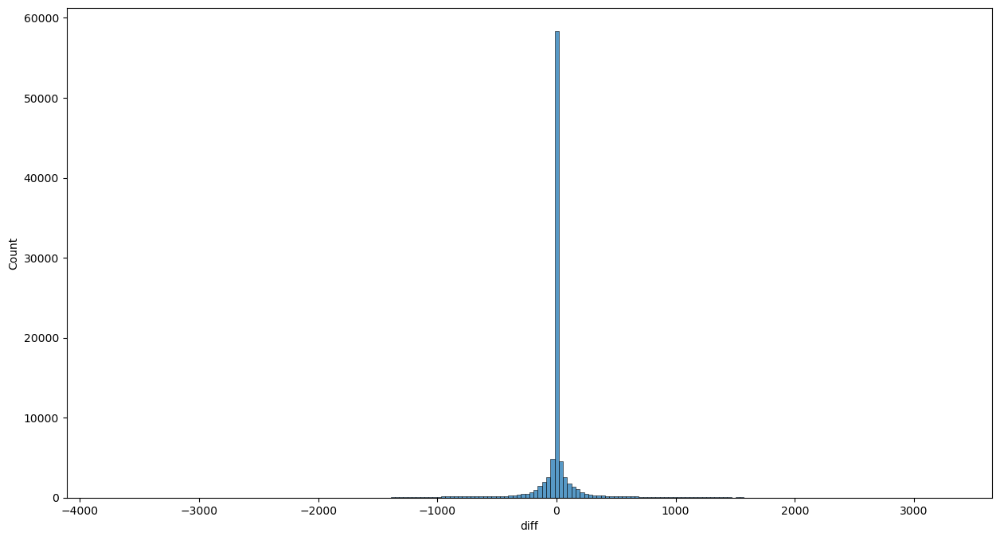

In [104]:
plt.figure(figsize=(15, 8))
sns.histplot(pv_hourly_diff["diff"], bins=200)

<Axes: xlabel='location', ylabel='diff'>

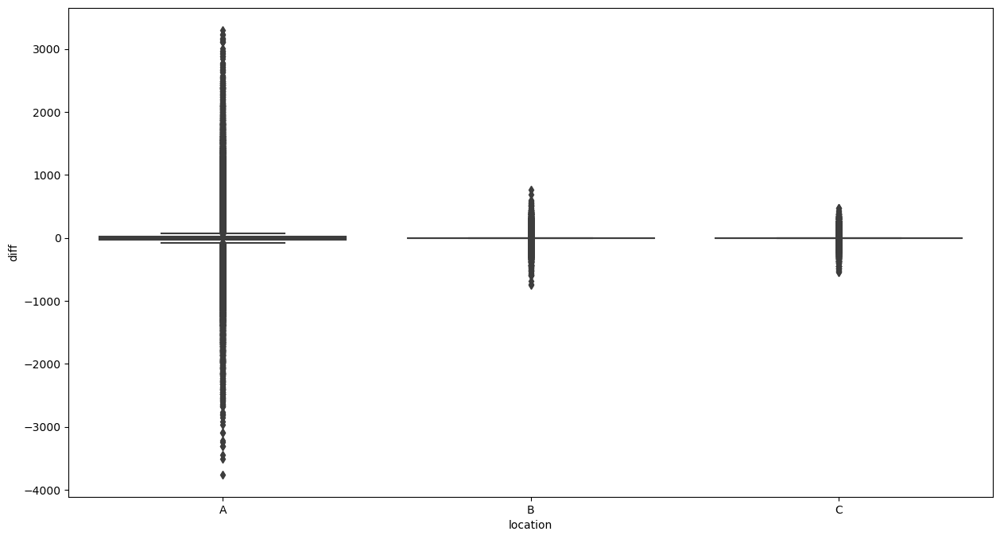

In [105]:
plt.figure(figsize=(15, 8))
sns.boxplot(y = pv_hourly_diff["diff"], x="location", data=pv_hourly_diff)

In [106]:
# #Make new dataframe per 30 min
# new_index = pd.date_range(start=y_cleaned_a.index.min(), end=y_cleaned_a.index.max(), freq='30T')
# y_cleaned_a_30min_mean = pd.DataFrame(index=new_index)

# y_cleaned_a_30min_mean = pd.concat([y_cleaned_a_30min_mean, y_cleaned_a], axis = 1)

In [107]:
# #Make hourly dataframe to loop over
# hourly_index = pd.date_range(start=y_cleaned_a.index.min(), end=y_cleaned_a.index.max(), freq='1H')

# #add the mean for 30 minute intervals, make sure only means where the measurement exists 30 min before and after
# for timestamp in hourly_index:
#     current_time = timestamp
#     hour_after = timestamp + pd.Timedelta(hours=1)


#     if current_time in y_cleaned_a.index and hour_after in y_cleaned_a.index:
#         current_value = y_cleaned_a.loc[current_time]
#         after_value = y_cleaned_a.loc[hour_after]
#         mean_value = (current_value + after_value) / 2.0
#         y_cleaned_a_30min_mean.loc[timestamp + pd.Timedelta(minutes=30), 'pv_measurement'] = mean_value

In [108]:
# pv_measurements_30min_mean_for_location = []

# #add a 30 min mean to each PV measurement in each location
# for location in ["A", "B", "C"]:
#     new_index = pd.date_range(start=train_all[train_all["location"] == location]["pv_measurement"].index.min(), end=train_all[train_all["location"] == location]["pv_measurement"].index.max(), freq='30T')
#     y_30min_mean = pd.DataFrame(index=new_index)
#     y_30min_mean = pd.concat([y_30min_mean,train_all[train_all["location"] == location]["pv_measurement"]], axis = 1)

#     #Make hourly dataframe to loop over
#     hourly_index = pd.date_range(start=train_all[train_all["location"] == location]["pv_measurement"].index.min(), end=train_all[train_all["location"] == location]["pv_measurement"].index.max(), freq='1H')

#     #add the mean for 30 minute intervals, make sure only means where the measurement exists 30 min before and after
#     for timestamp in hourly_index:
#         current_time = timestamp
#         hour_after = timestamp + pd.Timedelta(hours=1)


#         if current_time in train_all[train_all["location"] == location]["pv_measurement"].index and hour_after in train_all[train_all["location"] == location]["pv_measurement"].index:
#             current_value = train_all[train_all["location"] == location]["pv_measurement"].loc[current_time]
#             after_value = train_all[train_all["location"] == location]["pv_measurement"].loc[hour_after]
#             mean_value = (current_value + after_value) / 2.0
#             y_30min_mean.loc[timestamp + pd.Timedelta(minutes=30), 'pv_measurement'] = mean_value
#     pv_measurements_30min_mean_for_location.append(y_30min_mean.copy())

## Looking for outliers

<AxesSubplot:xlabel='location', ylabel='pv_measurement'>

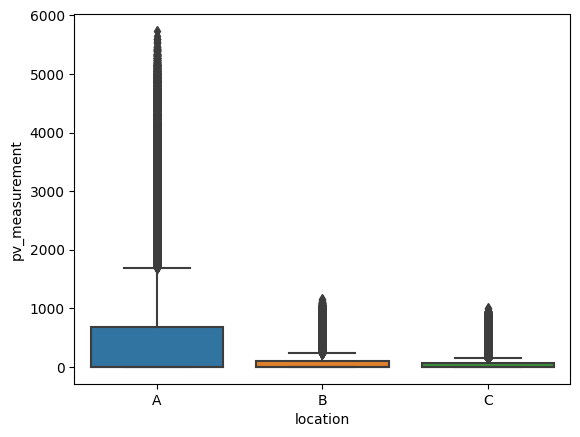

In [20]:
sns.boxplot(x="location", y = "pv_measurement", data=train_all) #Make a box plot of everything but 0 values

<AxesSubplot:xlabel='location', ylabel='pv_measurement'>

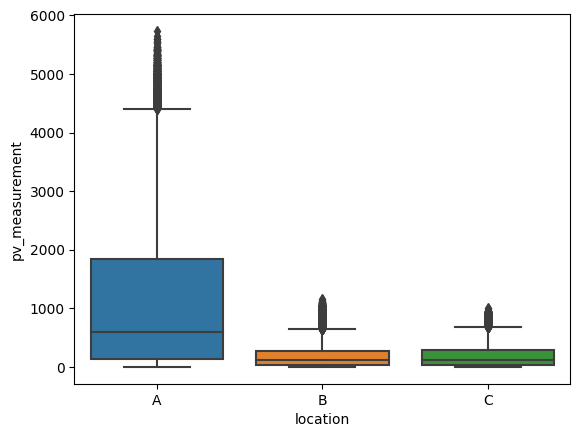

In [21]:
sns.boxplot(x="location", y = "pv_measurement", data=train_all[train_all["pv_measurement"] > 0])

<Axes: xlabel='pv_measurement', ylabel='Count'>

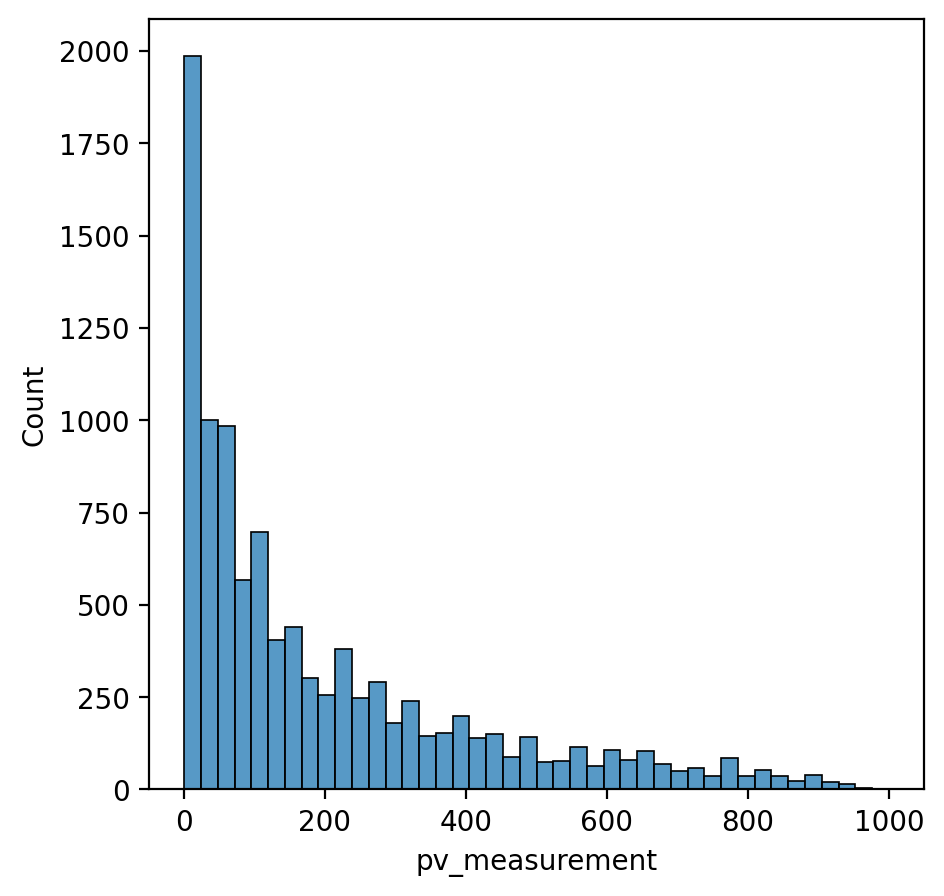

In [110]:
plt.figure(figsize = (5, 5), dpi=200)
sns.histplot(data=train_all_c[train_all_c["pv_measurement"] > 0]["pv_measurement"])

<AxesSubplot:>

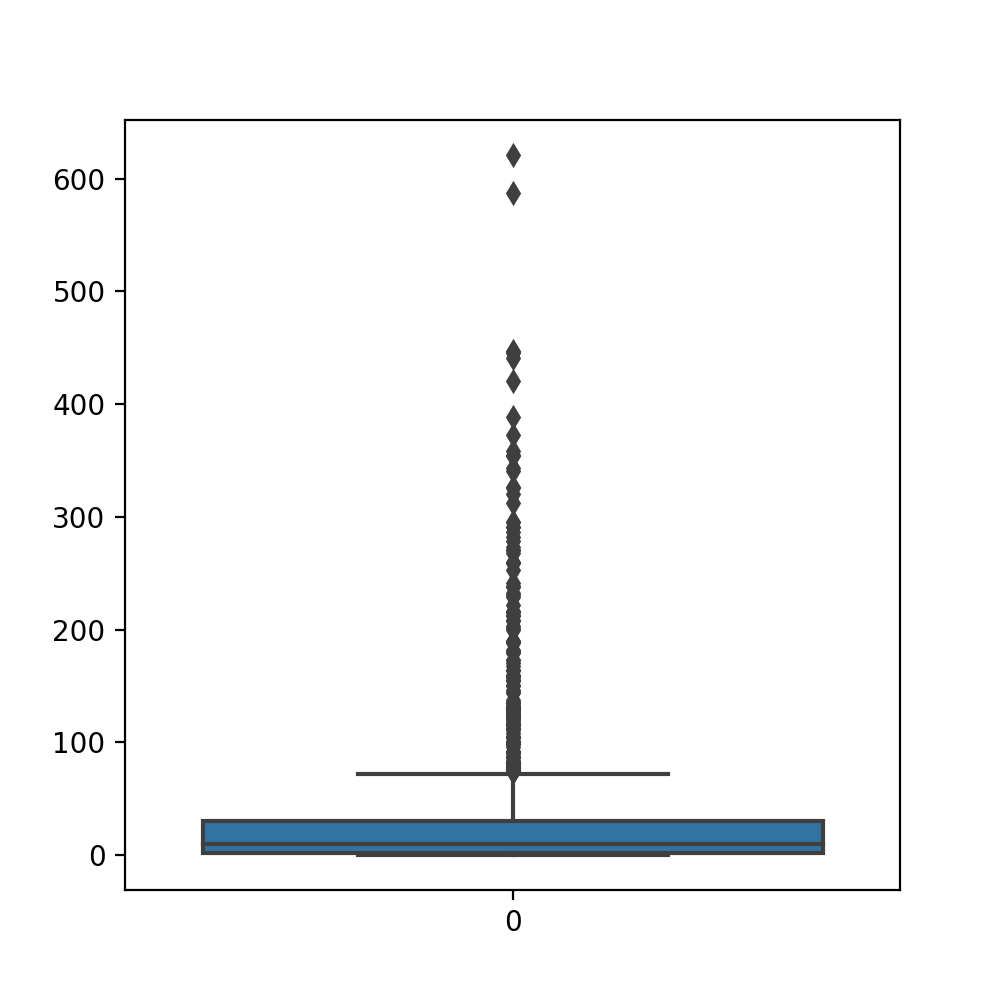

In [28]:
plt.figure(figsize = (5, 5), dpi=200)
#sns.histplot(data=train_all_c[(train_all_c["is_day:idx"] > 0) & (train_all_c["is_in_shadow:idx"] == 1)]["pv_measurement"])
sns.boxplot(data=train_all_a[(train_all_a["is_day:idx"] == 0) & (train_all_a["pv_measurement"] > 0)]["pv_measurement"])

In [19]:
train_all_c[(train_all_c["is_day:idx"] == 0) & (train_all_c["pv_measurement"] > 0)]["pv_measurement"]
#len(train_all[(train_all["is_day:idx"] == 0) & (train_all["pv_measurement"] > 100)])

2019-09-08 04:00:00     9.80
2019-09-23 05:00:00    19.60
2019-09-24 05:00:00     9.80
2019-09-25 05:00:00     9.80
2019-09-26 05:00:00     9.80
                       ...  
2023-04-26 20:00:00     1.96
2023-04-27 20:00:00     1.96
2023-04-28 20:00:00     2.94
2023-04-29 20:00:00     2.94
2023-04-30 20:00:00     2.94
Name: pv_measurement, Length: 234, dtype: float64

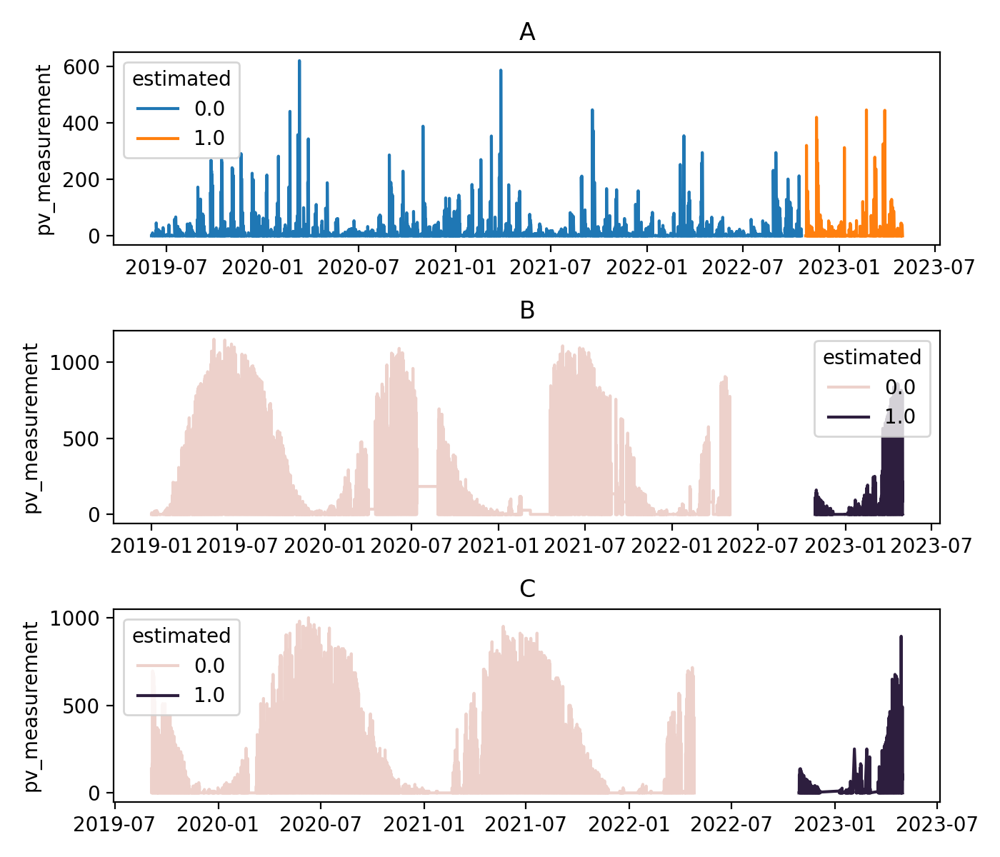

In [26]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(7, 6), dpi=200)
feature = "pv_measurement"
sns.lineplot(data = train_all_a[train_all_a["is_day:idx"] == 0], y=feature, x = train_all_a[train_all_a["is_day:idx"] == 0].index, ax=axs[0], hue="estimated")
sns.lineplot(data = train_all_b, y=feature, x = train_all_b.index, ax=axs[1], hue="estimated")
sns.lineplot(data = train_all_c, y=feature, x = train_all_c.index, ax=axs[2], hue="estimated")
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()
plt.show()

In [114]:
train_all["pv_measurement"].describe()

count    93023.000000
mean       287.022737
std        766.411327
min         -0.000000
25%          0.000000
50%          0.000000
75%        172.920000
max       5733.420000
Name: pv_measurement, dtype: float64

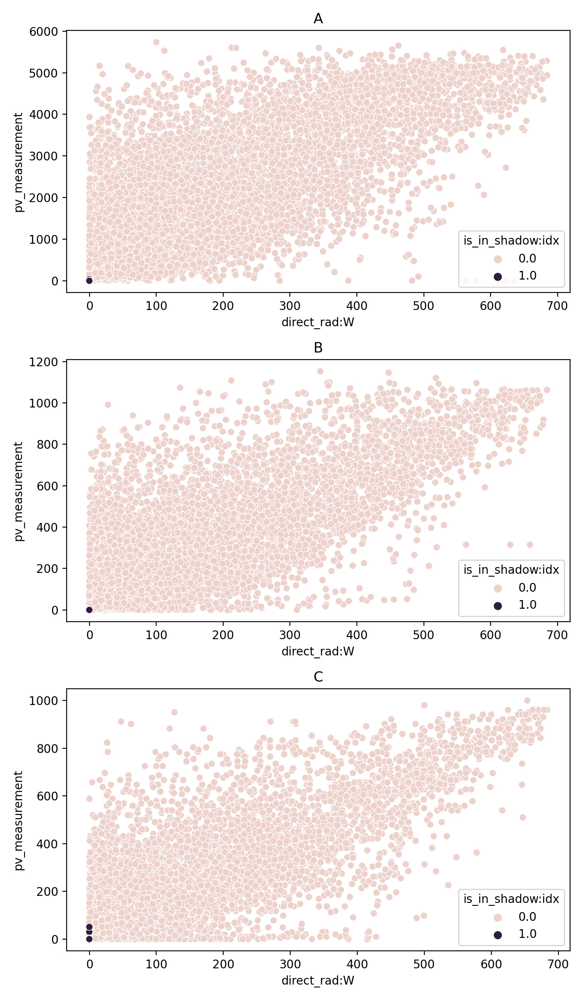

In [22]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(7, 12), dpi=200)
y_feature = "pv_measurement"
x_feature = "direct_rad:W"
hue_feature = "is_in_shadow:idx"
sns.scatterplot(x=x_feature, y=y_feature, data=train_all_a, ax=axs[0], hue=hue_feature)
sns.scatterplot(x=x_feature, y=y_feature, data=train_all[train_all["location"] == "B"], ax=axs[1], hue=hue_feature)
sns.scatterplot(x=x_feature, y=y_feature , data=train_all[train_all["location"] == "C"], ax=axs[2], hue=hue_feature)
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()

In [116]:
#inspecting the line in C vals
train_all_c[(train_all_c["pv_measurement"] > 180) & (train_all_c["pv_measurement"] < 185)]

,absolute_humidity_2m:gm3,air_density_2m:kgm3,ceiling_height_agl:m,clear_sky_energy_1h:J,clear_sky_rad:W,cloud_base_agl:m,dew_or_rime:idx,dew_point_2m:K,diffuse_rad:W,diffuse_rad_1h:J,direct_rad:W,direct_rad_1h:J,effective_cloud_cover:p,elevation:m,fresh_snow_12h:cm,fresh_snow_1h:cm,fresh_snow_24h:cm,fresh_snow_3h:cm,fresh_snow_6h:cm,is_day:idx,is_in_shadow:idx,msl_pressure:hPa,precip_5min:mm,precip_type_5min:idx,pressure_100m:hPa,pressure_50m:hPa,prob_rime:p,rain_water:kgm2,relative_humidity_1000hPa:p,sfc_pressure:hPa,snow_density:kgm3,snow_depth:cm,snow_drift:idx,snow_melt_10min:mm,snow_water:kgm2,sun_azimuth:d,sun_elevation:d,super_cooled_liquid_water:kgm2,t_1000hPa:K,total_cloud_cover:p,visibility:m,wind_speed_10m:ms,wind_speed_u_10m:ms,wind_speed_v_10m:ms,wind_speed_w_1000hPa:ms,estimated,date_calc,pv_measurement
2023-03-30 09:00:00,2.0,1.294,NaN,1299792.125,409.500000,7643.399902,0.0,261.899994,86.300003,300845.593750,350.600006,1.094899e+06,20.500000,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1008.599976,0.00,0.0,992.200012,998.500000,0.0,0.0,51.700001,1004.900024,NaN,0.0,0.0,0.0,0.0,139.983994,24.726000,0.0,268.500000,41.000000,47359.199219,2.0,-1.9,-0.7,0.0,1.0,2023-03-29 07:01:49,183.26
2023-04-04 15:00:00,4.9,1.265,NaN,1329689.000,313.500000,NaN,0.0,273.799988,79.300003,320986.687500,236.600006,9.769901e+05,1.900000,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1026.900024,0.00,0.0,1011.000000,1017.200012,0.0,0.0,54.500000,1023.400024,NaN,0.0,0.0,-0.0,0.0,239.977005,20.049999,0.0,279.899994,3.100000,45143.101562,2.0,-1.9,-0.6,0.0,1.0,2023-04-03 07:00:30,183.26
2023-04-08 15:00:00,6.6,1.276,NaN,1422173.875,338.799988,344.200012,0.0,277.799988,109.800003,425170.093750,116.300003,4.770266e+05,82.800003,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1034.300049,0.00,0.0,1018.299988,1024.599976,0.0,0.0,87.800003,1030.800049,NaN,0.0,0.0,-0.0,0.0,240.889999,21.334000,0.0,277.399994,82.800003,17240.500000,1.3,-0.5,-1.2,-0.0,1.0,2023-04-07 07:00:35,180.32
2023-04-19 17:00:00,6.2,1.259,NaN,761865.125,147.300003,NaN,0.0,277.200012,55.700001,226290.703125,101.400002,5.492350e+05,0.000000,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1037.900024,0.00,0.0,1022.099976,1028.300049,0.0,0.0,48.599998,1034.500000,NaN,0.0,0.0,-0.0,0.0,271.295013,11.689000,0.0,283.200012,0.000000,22816.699219,2.4,2.3,-0.7,0.0,1.0,2023-04-18 07:01:20,180.32
2023-04-24 14:00:00,3.9,1.253,1197.900024,2107515.000,541.900024,1012.900024,0.0,270.399994,175.000000,713333.312500,3.800000,3.690370e+04,100.000000,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1006.200012,0.00,0.0,990.700012,996.799988,0.0,0.0,56.400002,1002.900024,NaN,0.0,0.0,-0.0,0.4,228.809998,31.768999,0.0,277.200012,100.000000,11664.400391,3.2,-2.5,-2.0,0.0,1.0,2023-04-23 07:00:05,182.28
2023-04-25 08:00:00,4.7,1.267,1159.699951,1553836.875,490.600006,471.299988,0.0,272.700012,125.599998,408205.687500,0.500000,9.271000e+02,100.000000,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1005.599976,0.00,0.0,990.000000,996.099976,0.0,0.0,83.400002,1002.299988,NaN,0.0,0.0,-0.0,0.7,122.389999,29.125000,0.0,274.299988,100.000000,3669.000000,3.1,-2.8,-1.2,0.0,1.0,2023-04-24 07:00:05,184.24
2023-04-27 11:00:00,5.4,1.262,2381.000000,2462570.500,695.700012,176.600006,0.0,275.000000,244.100006,782673.312500,18.400000,5.000660e+04,100.000000,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1010.299988,0.00,0.0,994.500000,1000.599976,0.0,0.0,86.300003,1006.799988,NaN,0.0,0.0,-0.0,0.4,174.895996,40.210999,0.0,275.500000,100.000000,6300.100098,4.7,4.4,-1.9,0.0,1.0,2023-04-26 07:00:23,183.26
2023-04-29 10:00:00,4.7,1.270,874.500000,2327345.500,676.599976,367.500000,0.0,272.799988,120.800003,425408.906250,0.000000,3.840700e+03,100.000000,24.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1009.200012,0.05,2.0,993.599976,999.799988,0.0,0.0,83.300003,1006.000000,NaN,0.0,0.0,-0.0,0.7,156.026001,39.159000,0.1,274.600006,100.000000,3044.000000,4.1,3.9,-1.1,0.0,1.0,2023-04-28 07:00:04,183.26


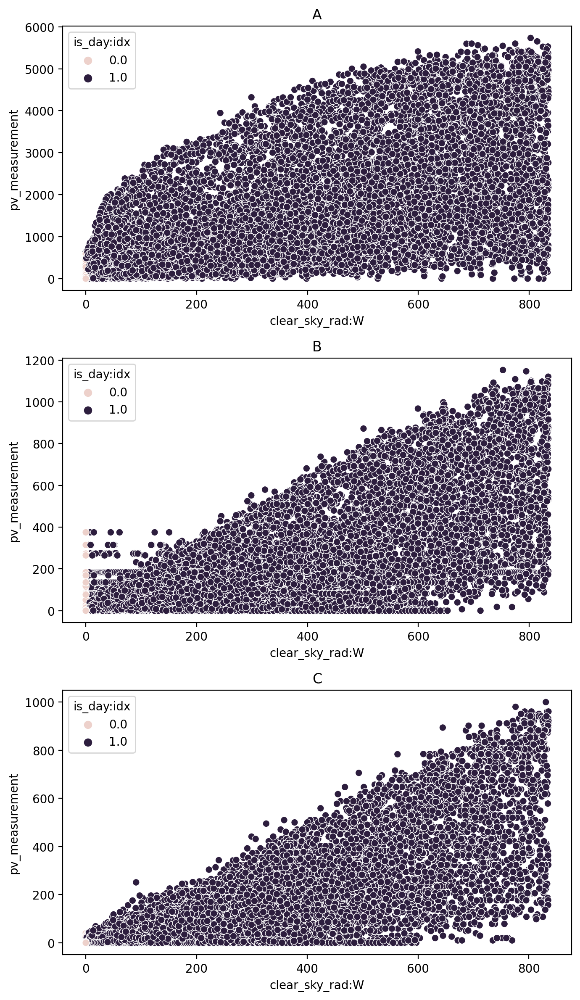

In [117]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(7, 12), dpi=200)
y_feature = "pv_measurement"
x_feature = "clear_sky_rad:W"
sns.scatterplot(x=x_feature, y=y_feature, data=train_all_a, ax=axs[0], hue="is_day:idx")
sns.scatterplot(x=x_feature, y=y_feature, data=train_all_b, ax=axs[1], hue="is_day:idx")
sns.scatterplot(x=x_feature, y=y_feature , data=train_all_c, ax=axs[2], hue="is_day:idx")
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()

At the moment the distribution is just very wide (cannot detect outliers from this). Maybe possible to detect outliers from a more narrow subsection of pv-measurements, such as the combintation of month, is_day, radian measurements and pv_measurements.

Strange stripes in B set, sometimes data seems to be stuck at zero pv_measurement values also

## Feature Engineering
Adding new rows, colums in order to create more training data
The 2 main things to be added are:
- Seasonal features (this is imporant as the tree models rarly accept date-times as data times)
- REmoving columns that are not very correlated to the target values

## Cleaning Data

#### Checking for missing values in the X_test data

In [59]:
X_test.isnull().sum()

absolute_humidity_2m:gm3             0
air_density_2m:kgm3                  0
ceiling_height_agl:m              2397
clear_sky_energy_1h:J                0
clear_sky_rad:W                      0
cloud_base_agl:m                   950
dew_or_rime:idx                      0
dew_point_2m:K                       0
diffuse_rad:W                        0
diffuse_rad_1h:J                     0
direct_rad:W                         0
direct_rad_1h:J                      0
effective_cloud_cover:p              0
elevation:m                          0
fresh_snow_12h:cm                    0
fresh_snow_1h:cm                     0
fresh_snow_24h:cm                    0
fresh_snow_3h:cm                     0
fresh_snow_6h:cm                     0
is_day:idx                           0
is_in_shadow:idx                     0
msl_pressure:hPa                     0
precip_5min:mm                       0
precip_type_5min:idx                 0
pressure_100m:hPa                    0
pressure_50m:hPa         

*notes cols with missing vals are:*
- Only ceiling_height_agl:m
- cloud_base_agl:m
- snow_density:kgm3


#### Lets check the training dataset for missing values

In [60]:
train_all.isnull().sum()

absolute_humidity_2m:gm3             72
air_density_2m:kgm3                  72
ceiling_height_agl:m              21673
clear_sky_energy_1h:J                72
clear_sky_rad:W                      72
cloud_base_agl:m                   9229
dew_or_rime:idx                      72
dew_point_2m:K                       72
diffuse_rad:W                        72
diffuse_rad_1h:J                     72
direct_rad:W                         72
direct_rad_1h:J                      72
effective_cloud_cover:p              72
elevation:m                          72
fresh_snow_12h:cm                    72
fresh_snow_1h:cm                     72
fresh_snow_24h:cm                    72
fresh_snow_3h:cm                     72
fresh_snow_6h:cm                     72
is_day:idx                           72
is_in_shadow:idx                     72
msl_pressure:hPa                     72
precip_5min:mm                       72
precip_type_5min:idx                 72
pressure_100m:hPa                    72


*Notes*
- X_all has virtually no Nan values (strange)
- training data always has 72 Nan (something went wrong in concatination)

#### Per Location

In [61]:
X_all_a.isnull().sum()

absolute_humidity_2m:gm3               0
air_density_2m:kgm3                    0
ceiling_height_agl:m               26959
clear_sky_energy_1h:J                  0
clear_sky_rad:W                        0
cloud_base_agl:m                   10458
dew_or_rime:idx                        0
dew_point_2m:K                         0
diffuse_rad:W                          0
diffuse_rad_1h:J                       0
direct_rad:W                           0
direct_rad_1h:J                        0
effective_cloud_cover:p                0
elevation:m                            0
fresh_snow_12h:cm                      0
fresh_snow_1h:cm                       0
fresh_snow_24h:cm                      0
fresh_snow_3h:cm                       0
fresh_snow_6h:cm                       0
is_day:idx                             0
is_in_shadow:idx                       0
msl_pressure:hPa                       0
precip_5min:mm                         0
precip_type_5min:idx                   0
pressure_100m:hP

*Notes*
Seems like an extra 24 rows is added for each dataframe when combining them the pv-measurement.


#### Lets find what rows cause our nan values

We clearly have an extra day of pv measurements, without weather forecasts for it.

In [62]:
train_all_a.drop(train_all_a[train_all_a["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)

In [63]:
train_all_a.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m               7778
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   3064
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


Lets repeat for all the dataframes

In [64]:
train_all_b.drop(train_all_b[train_all_b["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)
train_all_c.drop(train_all_c[train_all_c["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)

In [65]:
train_all_b.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m               6631
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   2786
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


In [66]:
train_all_c.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m               7192
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   3307
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


In [67]:
train_all.drop(train_all[train_all["absolute_humidity_2m:gm3"].isnull()].index, inplace=True)
train_all.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m              21601
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   9157
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


In [68]:
train_all.isnull().sum()

absolute_humidity_2m:gm3              0
air_density_2m:kgm3                   0
ceiling_height_agl:m              21601
clear_sky_energy_1h:J                 0
clear_sky_rad:W                       0
cloud_base_agl:m                   9157
dew_or_rime:idx                       0
dew_point_2m:K                        0
diffuse_rad:W                         0
diffuse_rad_1h:J                      0
direct_rad:W                          0
direct_rad_1h:J                       0
effective_cloud_cover:p               0
elevation:m                           0
fresh_snow_12h:cm                     0
fresh_snow_1h:cm                      0
fresh_snow_24h:cm                     0
fresh_snow_3h:cm                      0
fresh_snow_6h:cm                      0
is_day:idx                            0
is_in_shadow:idx                      0
msl_pressure:hPa                      0
precip_5min:mm                        0
precip_type_5min:idx                  0
pressure_100m:hPa                     0


#### Continued cleaning

The remaining column with alot of missing values are:
- ceiling_height_agl:m 
- cloud_base_agl:m 
- snow_density:kgm3
- pv_measurement

We now have the option of attempting to somehow fill inn these missing values with averages, predictions etc.


#### plotting cols with alot of missing values

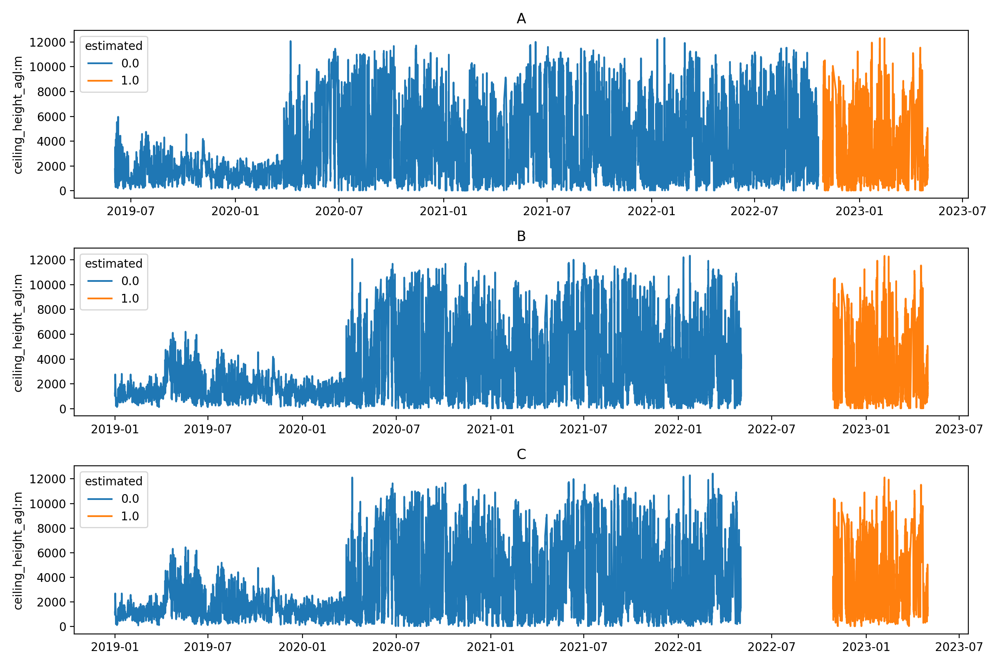

In [34]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(12, 8), dpi=200)
feature = "ceiling_height_agl:m"
sns.lineplot(data = train_all_a, y=feature, x = train_all_a.index, ax=axs[0], hue="estimated")
sns.lineplot(data = train_all_b, y=feature, x = train_all_b.index, ax=axs[1], hue="estimated")
sns.lineplot(data = train_all_c, y=feature, x = train_all_c.index, ax=axs[2], hue="estimated")
axs[0].title.set_text("A")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()

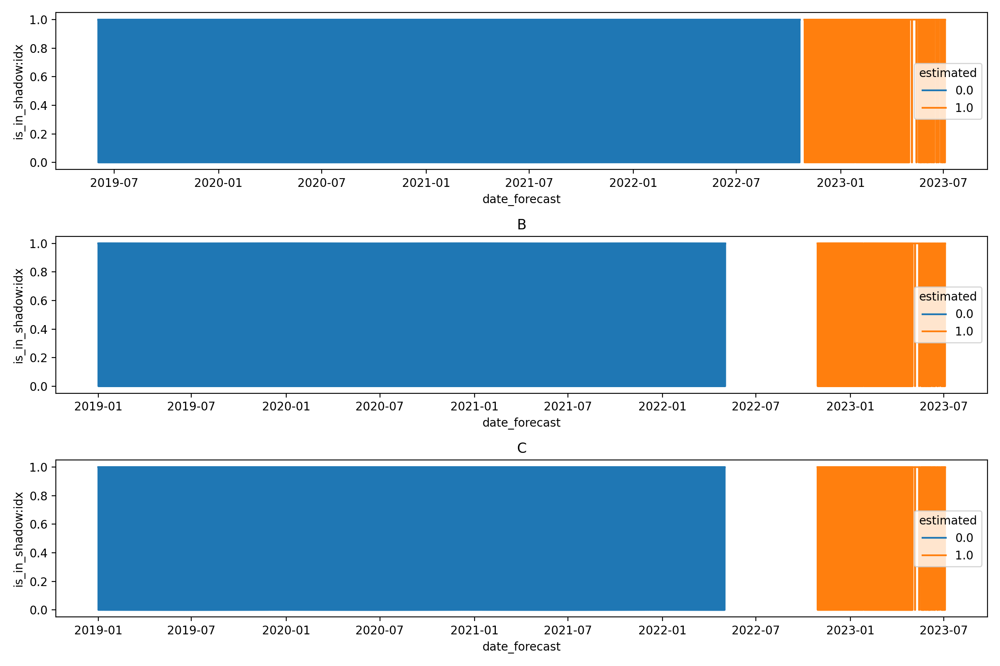

In [35]:
fig, axs = plt.subplots(nrows=3, ncols=1, figsize=(12, 8), dpi=200)
feature = "is_in_shadow:idx"
sns.lineplot(data = X_all[X_all["location"] == "A"], y=feature, x = X_all[X_all["location"] == "A"].index, ax=axs[0], hue="estimated")
sns.lineplot(data = X_all[X_all["location"] == "B"], y=feature, x = X_all[X_all["location"] == "B"].index, ax=axs[1], hue="estimated")
sns.lineplot(data = X_all[X_all["location"] == "C"], y=feature, x = X_all[X_all["location"] == "C"].index, ax=axs[2], hue="estimated")
axs[1].title.set_text("B")
axs[2].title.set_text("C")
plt.tight_layout()

*Notes*
- Location B and Location C are missing alot of rows from early 2022 till 2023! This can be seen from the fact that we have no Nan values for "is_in_shadow:idx" but there is obviously alot of missing values in our above lineplots

<AxesSubplot:>

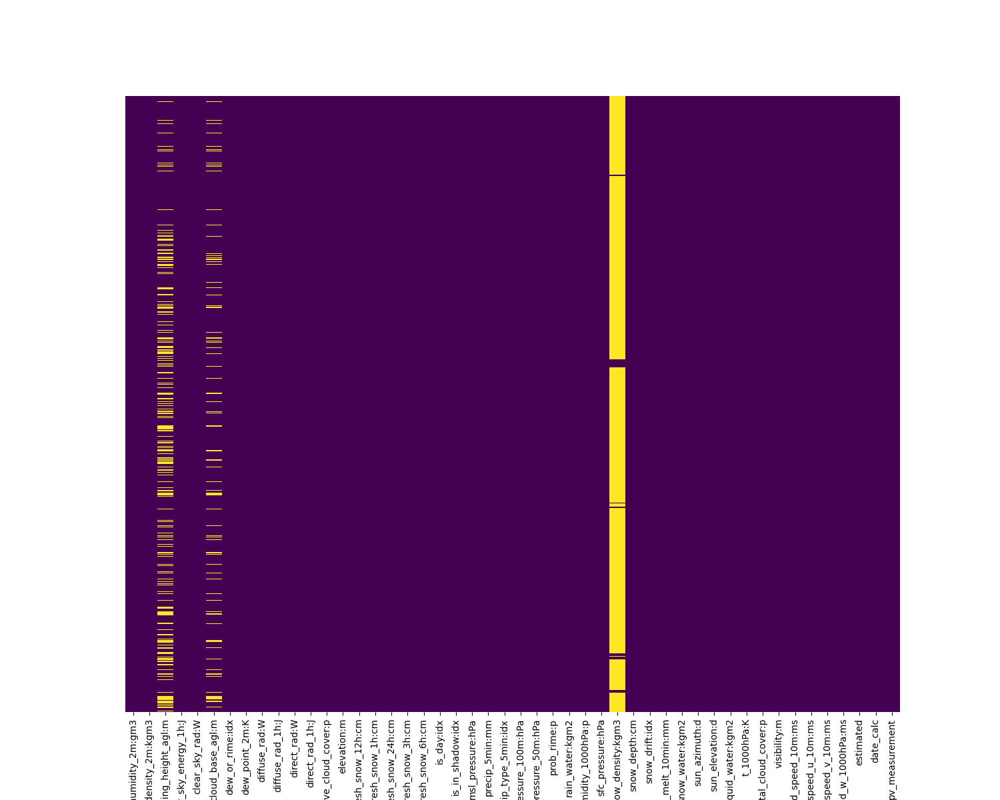

In [36]:
plt.figure(figsize=(15, 12))
sns.heatmap(train_all_a.isnull(), yticklabels = False, cbar = False, cmap = "viridis")

<AxesSubplot:>

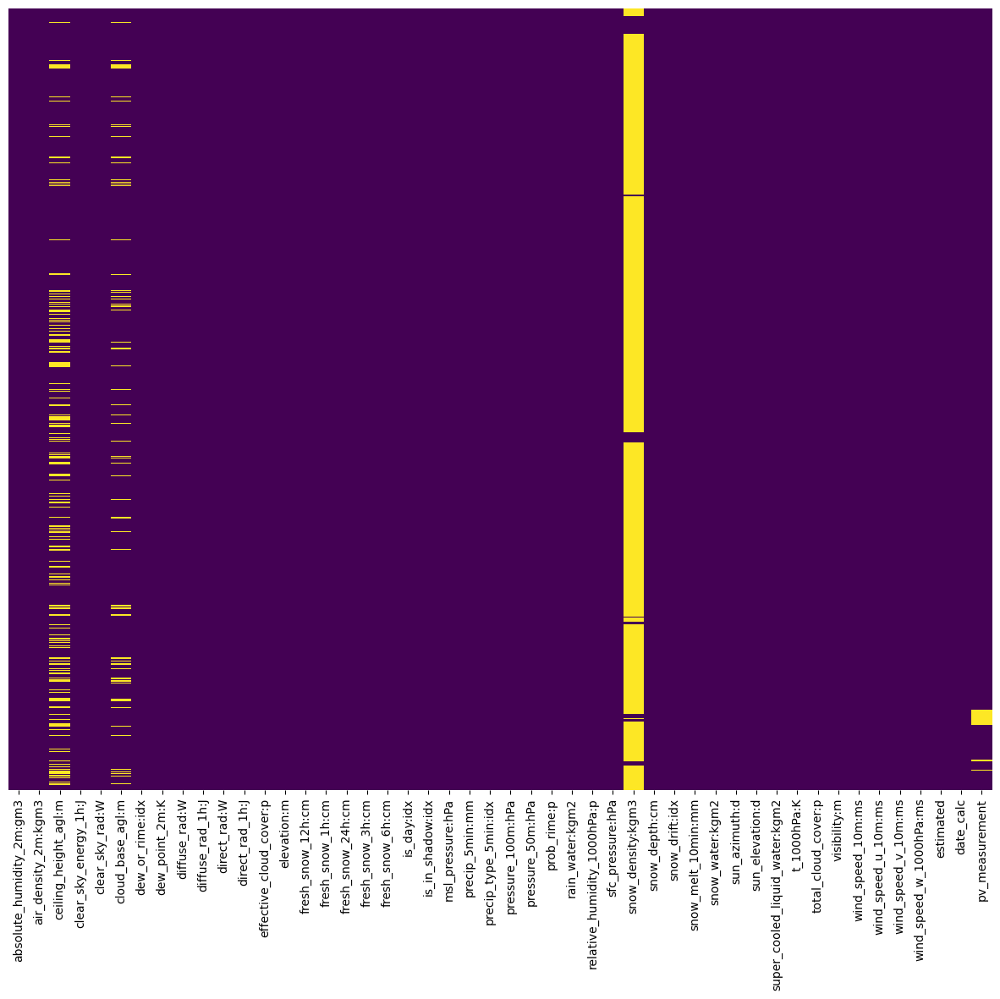

In [36]:
plt.figure(figsize=(15, 12))
sns.heatmap(train_all_b.isnull(), yticklabels = False, cbar = False, cmap = "viridis")

<AxesSubplot:>

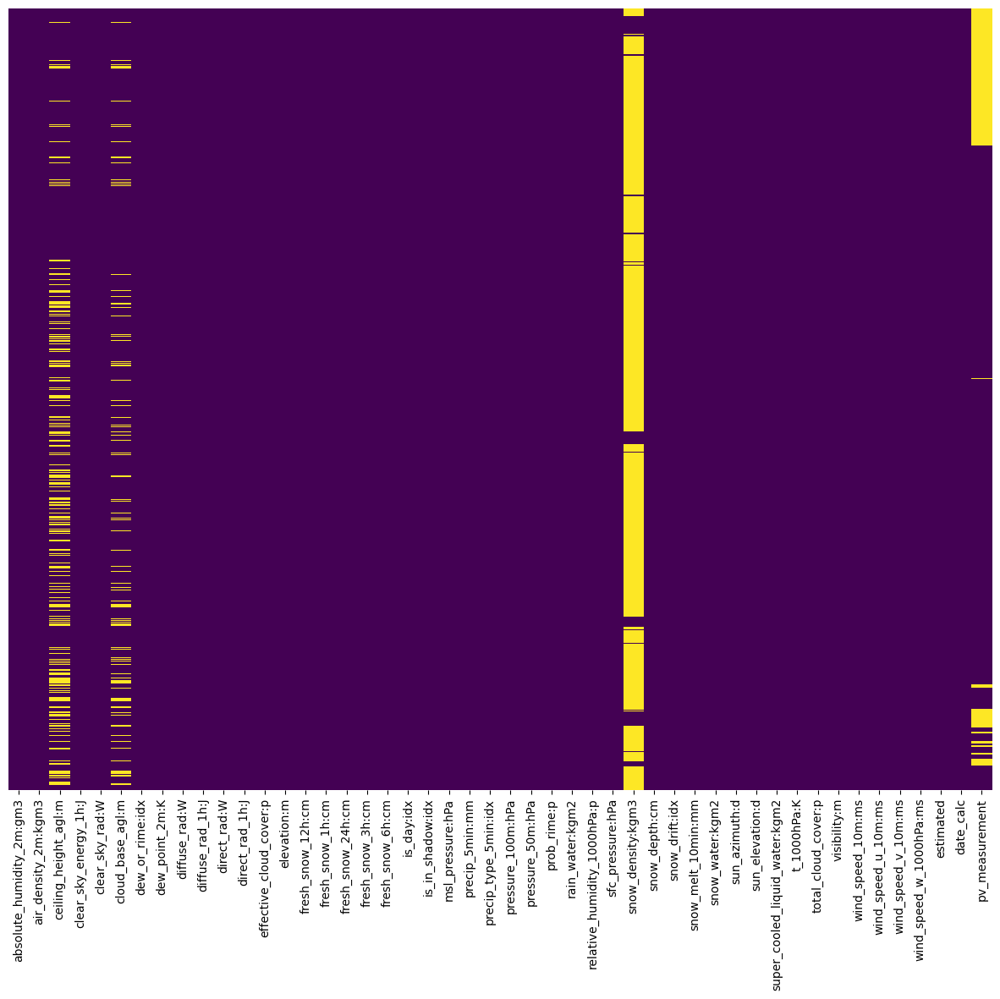

In [33]:
plt.figure(figsize=(15, 12))
sns.heatmap(train_all_c.isnull(), yticklabels = False, cbar = False, cmap = "viridis")

In [32]:
#Plotting the features most correlated with missing values
train_all.drop(["location"], axis=1).corr()[["ceiling_height_agl:m"]].sort_values(by="ceiling_height_agl:m")

,ceiling_height_agl:m
relative_humidity_1000hPa:p,-0.382765
super_cooled_liquid_water:kgm2,-0.320973
effective_cloud_cover:p,-0.297543
wind_speed_u_10m:ms,-0.286075
snow_water:kgm2,-0.169609
rain_water:kgm2,-0.135149
wind_speed_10m:ms,-0.124531
air_density_2m:kgm3,-0.119490
snow_depth:cm,-0.077132
is_in_shadow:idx,-0.058923


In [39]:
train_all.drop(["location"], axis=1).corr()[["cloud_base_agl:m"]].sort_values(by="cloud_base_agl:m")

,cloud_base_agl:m
relative_humidity_1000hPa:p,-0.443191
wind_speed_u_10m:ms,-0.350503
effective_cloud_cover:p,-0.304323
super_cooled_liquid_water:kgm2,-0.251199
wind_speed_10m:ms,-0.165226
snow_water:kgm2,-0.121513
air_density_2m:kgm3,-0.106415
rain_water:kgm2,-0.102316
precip_type_5min:idx,-0.070796
total_cloud_cover:p,-0.064083


In [90]:
def check_consequtive_missing(col, func, num_conseq):
    # Step 1: Identify consecutive missing values
    mask = train_all['ceiling_height_agl:m'].isna()
    consecutive_missing = mask.groupby((mask != mask.shift()).cumsum()).transform('sum')

    # Step 2: Calculate the average length of consecutive missing value blocks
    average_consecutive_missing = consecutive_missing[consecutive_missing < num_conseq].agg(func)
    print(average_consecutive_missing)

check_consequtive_missing("ceiling_height_agl:m", "count", 10)

90384


 - Snow density has only 6266 non-null values. The column can most likley be dropped without any consequences. 
 - ceiling_height_agl:m is more tricky as 21000 out of 101290 rows are missing data. We can choose to fill those rows with something like an average, or choose to drop the column completly. Both option should be tested against the models
- Cloud base has relativly few missing rows (~9000), so the col should not be dropped, as it has ~0.1 correlation to the pv measurements. Filling in the values somehow is preferred

- It also seems like Cloud Base and Ceiling height are missing values in the same columns
 


For an XGBoost alogrithim, it all these Nan values can be kept

#### Dropping snow density column in test and train and features with very low correlation

In [70]:
train_all = train_all.drop(["snow_density:kgm3"], axis=1)
X_test= X_test.drop(["snow_density:kgm3"], axis=1)

KeyError: "['snow_density:kgm3'] not found in axis"

## Lets add a summer only dataset

In [36]:
#train_all_summer = train_all[(train_all.index.month >= 5) & (train_all.index.month <= 7) & (train_all.index.day >= 1) & (train_all.index.day <= 30) | (train_all[train_all["estimated"] == 1].index.month >= 4 )]

ValueError: operands could not be broadcast together with shapes (101290,) (13182,) 

In [71]:
condition_summer = (
    (train_all.index.month >= 5) & 
    (train_all.index.month <= 7) & 
    (train_all.index.day >= 1) & 
    (train_all.index.day <= 30)
)

condition_estimated = (train_all["estimated"] == 1) & (train_all.index.month >= 4)

train_all_summer = train_all[condition_summer | condition_estimated]

In [39]:
train_all_summer.to_csv("summer.csv")

In [72]:
train_all = train_all_summer

### Saving datasets with Nan values except for in target value and snow density

In [73]:
train_all_pv_cleaned = train_all.dropna(axis=0, subset=["pv_measurement"])

In [74]:
X_train_all_pv_cleaned = train_all_pv_cleaned.drop(["pv_measurement", "date_calc"], axis=1)
Y_train_all_pv_cleaned = train_all_pv_cleaned[['pv_measurement']]
X_test_non_cleaned = X_test.drop("date_calc", axis=1)

In [75]:
#Making y_train for each dataset
Y_train_all_pv_cleaned_a = train_all_pv_cleaned[train_all_pv_cleaned["location"] == "A"][["pv_measurement"]]
Y_train_all_pv_cleaned_b = train_all_pv_cleaned[train_all_pv_cleaned["location"] == "B"][["pv_measurement"]]
Y_train_all_pv_cleaned_c = train_all_pv_cleaned[train_all_pv_cleaned["location"] == "C"][["pv_measurement"]]

In [78]:
#Saving the datasets
X_train_all_pv_cleaned.to_parquet("data/prepared_datasets/summer/X_train.parquet")
Y_train_all_pv_cleaned.to_parquet("data/prepared_datasets/summer/Y_train.parquet")
Y_train_all_pv_cleaned_a.to_parquet("data/prepared_datasets/summer/Y_train_a.parquet")
Y_train_all_pv_cleaned_b.to_parquet("data/prepared_datasets/summer/Y_train_b.parquet")
Y_train_all_pv_cleaned_c.to_parquet("data/prepared_datasets/summer/Y_train_c.parquet")
X_test_non_cleaned.to_parquet("data/prepared_datasets/summer/X_test.parquet")


#### Dropping values in train set - Maybe a bad idea

#### Dropping values in test set

### Filling in some missing values
THis can be done either through domain knowledge or statistical techniques to estimate

With domain Knowledge

With imputation techniques

#### Lets try a simple fill forward on the missing data in cloud base
- *This will most likly be to naive of a filling technique*
- *Should also be carefull to not fill values from 1 dataset into the next*

In [37]:
#Forward filling Cloud Base and ceiling height train
train_all_ff_a = train_all[train_all["location"] == "A"].copy()
train_all_ff_b = train_all[train_all["location"] == "B"].copy()
train_all_ff_c = train_all[train_all["location"] == "C"].copy()

train_all_ff_a["cloud_base_agl:m"].ffill(inplace=True)
train_all_ff_b["cloud_base_agl:m"].ffill(inplace=True)
train_all_ff_c["cloud_base_agl:m"].ffill(inplace=True)
train_all_ff_a["ceiling_height_agl:m"].ffill(inplace=True)
train_all_ff_b["ceiling_height_agl:m"].ffill(inplace=True)
train_all_ff_c["ceiling_height_agl:m"].ffill(inplace=True)

train_all = pd.concat([train_all_ff_a, train_all_ff_b, train_all_ff_c], axis=0)

#Forward Filling cloud base and ceiling height for test set
X_test_a = X_test[X_test["location"] == "A"].copy()
X_test_b = X_test[X_test["location"] == "B"].copy()
X_test_c = X_test[X_test["location"] == "C"].copy()

X_test_a["cloud_base_agl:m"].ffill(inplace=True)
X_test_b["cloud_base_agl:m"].ffill(inplace=True)
X_test_c["cloud_base_agl:m"].ffill(inplace=True)
X_test_a["ceiling_height_agl:m"].ffill(inplace=True)
X_test_b["ceiling_height_agl:m"].ffill(inplace=True)
X_test_c["ceiling_height_agl:m"].ffill(inplace=True)

X_test = pd.concat([X_test_a, X_test_b, X_test_c], axis=0)

In [38]:
train_all.isnull().sum()

absolute_humidity_2m:gm3             0
air_density_2m:kgm3                  0
ceiling_height_agl:m                 0
clear_sky_energy_1h:J                0
clear_sky_rad:W                      0
cloud_base_agl:m                     0
dew_or_rime:idx                      0
dew_point_2m:K                       0
diffuse_rad:W                        0
diffuse_rad_1h:J                     0
direct_rad:W                         0
direct_rad_1h:J                      0
effective_cloud_cover:p              0
elevation:m                          0
fresh_snow_12h:cm                    0
fresh_snow_1h:cm                     0
fresh_snow_24h:cm                    0
fresh_snow_3h:cm                     0
fresh_snow_6h:cm                     0
is_day:idx                           0
is_in_shadow:idx                     0
msl_pressure:hPa                     0
precip_5min:mm                       0
precip_type_5min:idx                 0
pressure_100m:hPa                    0
pressure_50m:hPa         

#### Imputing values with an iterative imputer and some forward filling

In [103]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.experimental import enable_iterative_imputer 
from sklearn.neighbors import KNeighborsRegressor
from sklearn.impute import IterativeImputer

tolerances = (1e-3, 1e-1, 1e-1, 1e-2)
neighbors = (5, 30)

impute_estimator = KNeighborsRegressor()
imputer = IterativeImputer(random_state=0, estimator=impute_estimator, max_iter=25)

#Feel like we should have some kind of time feature here
imputer.fit(train_all[train_all["location"] == "A"].drop(["date_calc", "location"], axis=1))
X_train_imputer_a = train_all.drop("pv_measurement", axis=1).copy()
imputer.transform(X_train)


X_train = train_all.drop("pv_measurement", axis=1)
imputer.transform(X_train)


c:\Users\Shahl\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\impute\_iterative.py:700: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
c:\Users\Shahl\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: FutureWarning: The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- date_calc
- location
Feature names seen at fit time, yet now missing:
- pv_measurement

  warnings.warn(message, FutureWarning)


TypeError: float() argument must be a string or a real number, not 'Timestamp'

#### Dropping rows with missing target values

In [39]:
train_all = train_all.dropna(axis=0, subset=["pv_measurement"])
train_all_a = train_all_a.dropna(axis=0, subset=["pv_measurement"])
train_all_b = train_all_b.dropna(axis=0, subset=["pv_measurement"])
train_all_c = train_all_c.dropna(axis=0, subset=["pv_measurement"])

In [40]:
train_all.isnull().sum()

absolute_humidity_2m:gm3          0
air_density_2m:kgm3               0
ceiling_height_agl:m              0
clear_sky_energy_1h:J             0
clear_sky_rad:W                   0
cloud_base_agl:m                  0
dew_or_rime:idx                   0
dew_point_2m:K                    0
diffuse_rad:W                     0
diffuse_rad_1h:J                  0
direct_rad:W                      0
direct_rad_1h:J                   0
effective_cloud_cover:p           0
elevation:m                       0
fresh_snow_12h:cm                 0
fresh_snow_1h:cm                  0
fresh_snow_24h:cm                 0
fresh_snow_3h:cm                  0
fresh_snow_6h:cm                  0
is_day:idx                        0
is_in_shadow:idx                  0
msl_pressure:hPa                  0
precip_5min:mm                    0
precip_type_5min:idx              0
pressure_100m:hPa                 0
pressure_50m:hPa                  0
prob_rime:p                       0
rain_water:kgm2             

## Saving manually cleaned datasets to the data folder

In [41]:
X_train_all = train_all.drop(["pv_measurement", "date_calc"], axis=1)
Y_train_all = train_all[['pv_measurement']]
X_test= X_test.drop("date_calc", axis=1)

In [42]:
X_train_all.to_parquet("data/prepared_datasets/forward_fill_ceiling_cloudbase/X_train.parquet")
Y_train_all.to_parquet("data/prepared_datasets/forward_fill_ceiling_cloudbase/Y_train.parquet")
X_test.to_parquet("data/prepared_datasets/forward_fill_ceiling_cloudbase/X_test.parquet")

## ML Models

### Preparing the preprocessed datasets for models

#### Random Forest Regressor Dataset
For the random forest model we need to hot-one encode the location feature as random forest regressor cannot handle string data.\
date_calc will also need to be removed as the model does not accept date-time values

In [150]:
#create hot-one encoded column for location
location = pd.get_dummies(train_all["location"], drop_first=True, dtype="float32")
train_all_rf = pd.concat([train_all.drop("location", axis=1), location], axis=1)

#Create final X,y for random forest in train set
X_train_all_rf = train_all_rf.drop(["pv_measurement", "date_calc"], axis=1)
Y_train_all = train_all_rf[['pv_measurement']]

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 92951 entries, 2019-06-02 22:00:00 to 2023-04-30 23:00:00
Data columns (total 1 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   pv_measurement  92951 non-null  float64
dtypes: float64(1)
memory usage: 1.4 MB


In [76]:
#Create final test set for random forest with hot-one encoded 
location_test = pd.get_dummies(X_test["location"], drop_first=True, dtype="float32")
X_test_rf = pd.concat([X_test.drop("location", axis=1), location_test], axis=1)
X_test_rf = X_test_rf.drop("date_calc", axis=1)

#### Saving ML ready data to datafolder

In [146]:
# Saving dataset without Nan and hot-one encoded
X_train_all_rf.to_parquet("data/prepared_datasets/no_Nan_hotone_encoding/X_train.parquet")
Y_train_all.to_parquet("data/prepared_datasets/no_Nan_hotone_encoding/Y_train.parquet")
X_test_rf.to_parquet("data/prepared_datasets/no_Nan_hotone_encoding/X_test.parquet")

AttributeError: 'Series' object has no attribute 'to_parquet'

### RandomForestRegressor